# Estimating Activity via Mobility Data at Points of Interest

![Development Status](https://img.shields.io/badge/status-in%20development-orange)
m
Analyzing the frequency of visits to or near points of interest may provide insights into the economic impacts of climate shocks. Similar to the now-discontinued [Google Community Mobility Reports](https://www.google.com/covid19/mobility/), this methodology tracks changes in mobility by counting visits to [Overture Maps](https://overturemaps.org) points of interest, compared to a baseline.

By tracking changes in the number of visits to points of interest (POIs) over time, we use visit counts as a proxy for activity levels. This method allows us to infer shifts in population mobility and identify social or economic trends, particularly during crises. The baseline visit count represents the typical or expected number of visits to a given POI. Subsequent visit counts are then compared to this baseline to assess changes in movement patterns. For example, a decline in visits may suggest reduced economic activity, such as fewer shoppers at retail locations, fewer workers at office spaces, or reduced commuter traffic at transit hubs.

This approach offers a more focused insight into specific types of activity, as it directly measures engagement with predefined locations of interest. However, it also has limitations similar to those of tracking device density, as detailed in {ref}`mobility-activity-limitations`. Mobility data is collected through convenience sampling, meaning it captures only a subset of the population that visits these POIs, rather than representing the entire population through randomized sampling. Additionally, not all visits are equal in terms of economic significance, and certain locations may see more variation in visit counts due to external factors unrelated to overall economic trends.

In [1]:
import dask.dataframe as dd
import dask_geopandas
import geopandas
import mobilyze
import pandas as pd
import xyzservices.providers as xyz
from bokeh.plotting import output_notebook, show
from mobilyze.activity import categorize, compute_stops
from mobilyze.plotting import (
    plot_spatial_distribution,
    plot_temporal_distribution,
    plot_visits_by_group,
)

%load_ext autoreload
%autoreload 2

%load_ext watermark
%watermark -b -iv

Git branch: main

geopandas     : 0.10.2
mobilyze      : 24.9.1
dask          : 2023.5.0
dask_geopandas: 0.3.1
pandas        : 1.5.3



In [3]:
# Parameters
## https://papermill.readthedocs.io/en/latest/usage-parameterize.html"

## Data

In this section, we import data from various sources, either publicly available or obtained through data sharing agreements.

### Area of Interest

In this step, we import the area of interest created from [geoBoundaries](https://www.geoboundaries.org) and shown below. This area covers the countries of [Bosnia and Herzegovina](https://www.worldbank.org/en/country/bosniaandherzegovina), [North Macedonia](https://www.worldbank.org/en/country/northmacedonia) and [Serbia](https://www.worldbank.org/en/country/serbia).

In [4]:
AOI = geopandas.read_file("../../data/final/areas/AOI.gpkg")

AOI[AOI["shapeGroup"] != "TUR"].explore(
    color="blue", style_kwds={"stroke": True, "opacity": 0.5}
)

### Mobility Data

This study used longitudinal human mobility data, which includes anonymized, timestamped geographical points from GPS-enabled devices. 
The mobility data has been provided by [Veraset Movement](https://veraset.com) and obtained through the [Monitoring Near-Time Changes in Urban Space Usage after Climate Shocks: ECA Urban Resilience](https://portal.datapartnership.org/readableproposal/523) proposal of the [Development Data Partnership](https://datapartnership.org). This dataset covers the countries of [Bosnia and Herzegovina](https://www.worldbank.org/en/country/bosniaandherzegovina), [North Macedonia](https://www.worldbank.org/en/country/northmacedonia) and [Serbia](https://www.worldbank.org/en/country/serbia).

In [5]:
ddf = dd.read_parquet(
    [
        "../../data/final/panels/v1.1/country=BA/**/*.parquet",
        "../../data/final/panels/v1.1/country=MK/**/*.parquet",
        "../../data/final/panels/v1.1/country=RS/**/*.parquet",
    ]
)

In [6]:
len(ddf)

54101089

Let's look at the spatiotemporal distribution below. Further information, please see also [Data Quality Assessment](data-quality-assessment.ipynb). See also {ref}`limitations`.

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
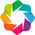

:DynamicMap   []
   :Overlay
      .Tiles.I :Tiles   [x,y]
      .Image.I :Image   [x,y]   (Count)

In [7]:
mobilyze.plotting.plot_spatial_distribution(ddf)

In [8]:
show(mobilyze.plotting.plot_temporal_distribution(ddf))

```{important}
Mobility data, while valuable for understanding movement patterns, suffers from significant sample bias and limitations. One prominent issue is urban skewness, where data is often disproportionately collected from urban areas with higher smartphone usage, better infrastructure, and more active digital services. This results in an overrepresentation of densely populated, affluent cities while underrepresenting rural or underserved regions where mobile device usage may be lower or less consistent. Additionally, mobility data often lacks demographic diversity, as it predominantly captures movements of individuals who have access to mobile technology, leaving out vulnerable or marginalized populations. These biases can lead to incomplete or misleading insights, especially when used to inform policy decisions or urban planning. Moreover, data privacy concerns and inconsistent data quality further limit the reliability of such datasets, necessitating careful interpretation and complementary data sources to mitigate skewed conclusions.
```

### Points of Interest 

The project team used the [Humanitarian OpenStreetMap](https://hotosm.org) [datasets](https://data.humdata.org/dataset/hotosm_bih_health_facilities) available on HDX, which includes education and health faciliates, e.g., [Bosnia and Herzegovina Health Facilities (OpenStreetMap Export)](https://data.humdata.org/dataset/hotosm_bih_health_facilities).

In [9]:
POI = pd.concat(
    [
        dask_geopandas.read_file(p, npartitions=4).to_crs("EPSG:4326").compute()
        for p in [
            "https://s3.dualstack.us-east-1.amazonaws.com/production-raw-data-api/ISO3/BIH/education_facilities/polygons/hotosm_bih_education_facilities_polygons_geojson.zip!hotosm_bih_education_facilities_polygons_geojson.geojson",
            "https://s3.dualstack.us-east-1.amazonaws.com/production-raw-data-api/ISO3/BIH/health_facilities/polygons/hotosm_bih_health_facilities_polygons_geojson.zip!hotosm_bih_health_facilities_polygons_geojson.geojson",
            "https://s3.us-east-1.amazonaws.com/production-raw-data-api/ISO3/MKD/education_facilities/polygons/hotosm_mkd_education_facilities_polygons_geojson.zip!hotosm_mkd_education_facilities_polygons_geojson.geojson",
            "https://s3.us-east-1.amazonaws.com/production-raw-data-api/ISO3/MKD/health_facilities/polygons/hotosm_mkd_health_facilities_polygons_geojson.zip!hotosm_mkd_health_facilities_polygons_geojson.geojson",
            "https://s3.us-east-1.amazonaws.com/production-raw-data-api/ISO3/SRB/education_facilities/polygons/hotosm_srb_education_facilities_polygons_geojson.zip!hotosm_srb_education_facilities_polygons_geojson.geojson",
            "https://s3.us-east-1.amazonaws.com/production-raw-data-api/ISO3/SRB/health_facilities/polygons/hotosm_srb_health_facilities_polygons_geojson.zip!hotosm_srb_health_facilities_polygons_geojson.geojson",
            # "https://s3.us-east-1.amazonaws.com/production-raw-data-api/ISO3/TUR/education_facilities/polygons/hotosm_tur_education_facilities_polygons_geojson.zip!hotosm_tur_education_facilities_polygons_geojson.geojson",
            # "https://s3.us-east-1.amazonaws.com/production-raw-data-api/ISO3/TUR/health_facilities/polygons/hotosm_tur_health_facilities_polygons_geojson.zip!hotosm_tur_health_facilities_polygons_geojson.geojson",
        ]
    ]
)

Buffering the geometries to create a buffer zone around each feature.

In [10]:
POI["geometry"] = POI["geometry"].to_crs("EPSG:3857").buffer(5).to_crs("EPSG:4326")

To demonstrate ain, we visualize the OpenStreetMap points of interest with the key `amenity=school` below.

In [11]:
POI[POI["amenity"] == "school"].explore(column="amenity", tiles=xyz.CartoDB.DarkMatter)

In [12]:
# Combine with area of interest
POI = POI.sjoin(AOI, how="inner", predicate="within").drop(
    ["index_right"], axis="columns"
)
# Categorize
POI["category"] = POI.apply(categorize, axis=1)

In [13]:
# POI.to_file("../../data/final/POI.geojson", driver="GeoJSON")
# POI = geopandas.read_file("../../data/final/POI.geojson")

## Methodology

Inspired by the now-discontinued [Google Community Mobility Reports](https://www.google.com/covid19/mobility/), this methodology is designed to track changes in mobility by measuring the frequency of visits to points of interest (POIs) sourced from [OpenStreetMap](https://www.openstreetmap.org). We compare these visit frequencies to a baseline to identify variations in mobility patterns.

We employ a spatial join approach to determine whether a device has been detected within a POI at least once during the observation period. This involves assessing whether device stops fall within the boundaries of designated POIs and counting the number of visits to each POI. While estimating stay locations and the spatial join execution method provides a straightforward way to measure visit frequency, it is a simplified approach compared to more advanced techniques. 

Overall, this approach helps in understanding shifts in mobility within specific areas, but it should be interpreted with the understanding that it captures only a fraction of the overall population’s movements and does not account for all factors influencing visit frequency.The mobility data used reflects only a subset of the overall population in the area—specifically, individuals who have Location Services enabled on their mobile devices. This data does not represent the total population density and may not capture all movements within the area.

#### Compute Stay Locations

In this section, we will compute the stay locations, which identify locations where devices remained stationary for a significant period of time. The process involves analyzing the movement patterns of devices to determine periods of dwelling within specific geographical areas. First, we will filter the data to isolate stationary points, then aggregate them by location and time to compute the total number of stops. Visualizations are provided to illustrate the computation and results. 

Using mobility data, we will apply spatial and temporal thresholds to detect these stops, being $\Delta t := $5 (minutes) and $\Delta l :m= 100$ meters {cite}`Ubaldi2024`.

In [15]:
STOPS = mobilyze.activity.compute_stops(
    ddf, stay_locations_kwds={"minutes_for_a_stop": 5.0, "spatial_radius_km": 0.1}
)

In [52]:
# STOPS = dd.read_parquet("../../data/interim/stops/*.parquet")
# STOPS = dask_geopandas.from_dask_dataframe(
#     STOPS,
#     geometry=dask_geopandas.points_from_xy(STOPS, "lng", "lat"),
# ).set_crs("EPSG:4326")

#### Compute Spatial Joins

Using [Dask-GeoPandas]([Dask-GeoPandas](https://dask-geopandas.readthedocs.io/en/stable/)), we first perform a spatial join to match stops with points of interest. Following this, we aggregate the number of visits spatiotemporally. This involves grouping the data by H3 grid cells, weekly intervals, and amenity classifications, such as `amenity=school` areas.

In [45]:
VISITS = (
    STOPS.sjoin(POI, predicate="within")
    .groupby(
        ["category", "hex_id", "date", "shapeISO", "shapeName", "shapeGroup"],
        observed=False,
    )["uid"]
    .count()
    .to_frame(name="count")
)

In [19]:
# VISITS.to_parquet(f"../../data/interim/visits")
# VISITS = dd.read_parquet(f"../../data/interim/visits")

## Results

In this section, we visualize the weekly visits detected within each [OpenStreetMap](https://www.openstreetmap.org) [amenity](https://wiki.openstreetmap.org/wiki/Key:amenity) key. By aggregating the number of visits, we provide a smoothed total showing the number of detected users across the entire area for each time period. We aggregate data based on administrative divisions; however, since the underlying data is based on `hex_id`, the results can be aggregated and presented at any geographic level compatible with the H3 resolution.

In [60]:
result = VISITS.compute().reset_index()
result["date"] = pd.to_datetime(result["date"])

/Users/g4brielvs/.pyenv/versions/miniforge3-latest/envs/datapartnership-urban-resilience-after-climate-shocks/lib/python3.9/site-packages/distributed/client.py:3108: UserWarning: Sending large graph of size 13.60 MiB.
This may cause some slowdown.
Consider scattering data ahead of time and using futures.
  warnings.warn(


In [58]:
import datetime

from bokeh.models import BoxAnnotation


def _adjust_plot(p):
    for tab in p.tabs:
        c = tab.child

        # Add annotation
        boxes = [
            BoxAnnotation(fill_color="#bbbbbb", fill_alpha=0.2, left=left, right=right)
            for left, right in [
                (datetime.datetime(2022, 9, 1), datetime.datetime(2023, 5, 31)),
            ]
        ]
        c.renderers.extend(boxes)

        # Adjust x-axis range after plot creation
        c.x_range.start = datetime.datetime(2022, 6, 1)
        c.x_range.end = datetime.datetime(2023, 9, 1)

    return p

#### Bosnia and Herzegovina

In [61]:
p = plot_visits_by_group(result, group="BIH")
show(_adjust_plot(p))

#### North Macedonia

In [62]:
p = plot_visits_by_group(data, group="MKD")
show(_adjust_plot(p))

#### Serbia

In [63]:
p = plot_visits_by_group(result, group="SRB")
show(_adjust_plot(p))

## Limitations

```{seealso}
{ref}`limitations`
```
### Limitations of using mobility data to estimate economic activity
```{warning}
- **Sample Bias:** Mobility data is collected from sources like mobile phone networks, GPS devices, and transportation systems. These sources may not capture the entire population or all economic activities, leading to potential sample bias and inaccurate estimations. Some individuals or businesses may lack access to the technology that generates this data, resulting in underrepresentation of certain demographics or economic sectors.

- **Incomplete Coverage:** The mobility data is derived from a convenience sample of GPS-enabled devices, specifically those with location tracking enabled. This sample represents only a subset of the total population in an area and does not account for individuals who do not use GPS or have location tracking turned off. Consequently, the derived metrics do not reflect the total population density accurately.

- **Lack of Contextual Information:** Mobility data mainly captures movement patterns and geolocation information. It often lacks other crucial details such as transactional data, business types, or specific economic activities, which are necessary for accurate economic activity estimation.
```

### Limitations of using points of interest database from OpenStreetMap
```{warning}
- **Data Quality:** OpenStreetMap (OSM) relies on user contributions, which can vary in quality and may not always be current. The accuracy and completeness of the points of interest (POI) database can differ widely between regions and categories.

- **Bias and Incompleteness:** OSM data can be biased towards areas with more active contributors. Some regions or types of businesses may be underrepresented, particularly in less-populated or less-developed areas, leading to incomplete or skewed data.

- **Lack of Standardization:** OSM does not enforce strict data standards, resulting in inconsistent formats, categorizations, and attributes for POIs. This lack of standardization can make it difficult to compare and analyze data consistently across different regions or time periods.

- **Verification and Validation:** While OSM benefits from community-driven data verification, the absence of a centralized authority or rigorous validation process can introduce errors and inaccuracies. Determining the reliability of information in the POI database can be challenging.

- **Limited Contextual Information:** The OSM database primarily provides geospatial information, such as coordinates and basic attributes of POIs. It may lack additional context, such as detailed business descriptions, operational hours, or transactional data, which can limit its utility for comprehensive economic analysis.
```

## References

```{bibliography}
:filter: docname in docnames
:style: plain
```